In [2]:
!gdown 1ZV_nCUfuitYz0vpKFhg5wdwz_LlaVQVo
!unzip 'Avengers 1.zip'

"gdown" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.
"unzip" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


In [ ]:
!pip install face_recognition

In [1]:
import face_recognition as fr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
import os
import csv
from lime import lime_tabular
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

#Actividad 1

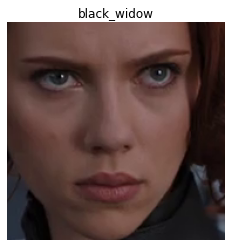

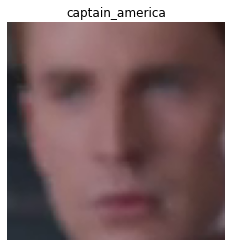

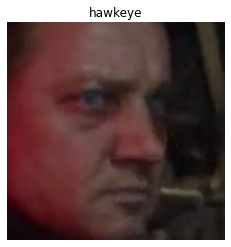

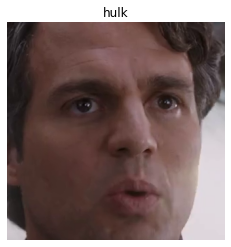

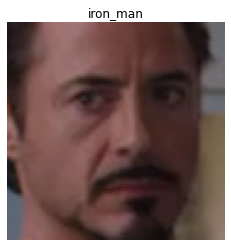

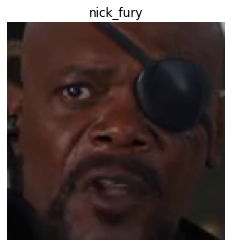

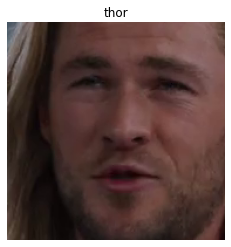

Superhéroe: black_widow
Número de imágenes: 1138
------------------------------
Superhéroe: captain_america
Número de imágenes: 1194
------------------------------
Superhéroe: hawkeye
Número de imágenes: 378
------------------------------
Superhéroe: hulk
Número de imágenes: 976
------------------------------
Superhéroe: iron_man
Número de imágenes: 1854
------------------------------
Superhéroe: nick_fury
Número de imágenes: 231
------------------------------
Superhéroe: thor
Número de imágenes: 942
------------------------------
Total de imágenes: 6713
Clases únicas: 7


In [2]:
avengers_folder = os.path.join("Avengers 1", "Avengers 1")


for superhero_folder in os.listdir(avengers_folder):
    superhero_path = os.path.join(avengers_folder, superhero_folder)
    if os.path.isdir(superhero_path):
        for filename in os.listdir(superhero_path):
            image_path = os.path.join(superhero_path, filename)
            if os.path.isfile(image_path):
                image = fr.load_image_file(image_path)

                # Mostrar la imagen con etiqueta
                plt.imshow(image)
                plt.title(superhero_folder)
                plt.axis('off')
                plt.show()

                # Mostrar solo una foto por superhéroe
                break

# Distribución de clases
class_distribution = {}

for superhero_folder in os.listdir(avengers_folder):
    superhero_path = os.path.join(avengers_folder, superhero_folder)
    if os.path.isdir(superhero_path):
        num_images = len(os.listdir(superhero_path))
        class_distribution[superhero_folder] = num_images

# Imprimir la distribución de clases
for superhero, count in class_distribution.items():
    print("Superhéroe:", superhero)
    print("Número de imágenes:", count)
    print("------------------------------")

# Calcular y mostrar el total de imágenes y las clases únicas
total_images = sum(class_distribution.values())
unique_classes = len(class_distribution)
print("Total de imágenes:", total_images)
print("Clases únicas:", unique_classes)

Cuándo se utiliza el *fr.load_image_file(image_path)* , este devuelve un objeto de tipo *Numpy array* que contiene los valores de los pixeles de la imagen. Luego estos pixeles se cargan utilizando la librería *matplotlib* y se muestra la imagen.

#Actividad 2

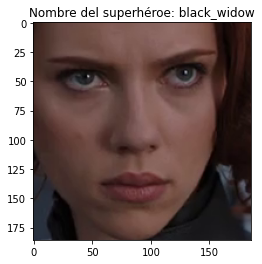

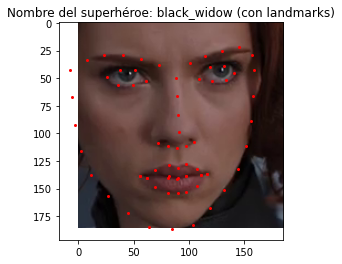

Nombre del superhéroe: black_widow
Landmarks del superhéroe: {'chin': [(-8, 43), (-6, 67), (-3, 92), (2, 116), (11, 138), (27, 157), (45, 172), (64, 185), (85, 187), (104, 183), (119, 168), (132, 151), (144, 132), (152, 111), (156, 89), (158, 66), (159, 43)], 'left_eyebrow': [(8, 34), (23, 29), (40, 29), (57, 33), (73, 38)], 'right_eyebrow': [(101, 36), (115, 30), (130, 25), (145, 22), (157, 29)], 'nose_bridge': [(88, 50), (89, 66), (90, 83), (91, 99)], 'nose_tip': [(72, 109), (81, 111), (89, 113), (97, 111), (105, 108)], 'left_eye': [(26, 49), (38, 43), (51, 43), (61, 53), (49, 56), (36, 56)], 'right_eye': [(109, 51), (119, 40), (132, 39), (141, 45), (134, 52), (121, 53)], 'top_lip': [(56, 139), (69, 133), (82, 129), (90, 131), (97, 128), (107, 132), (116, 137), (111, 138), (97, 139), (90, 140), (82, 139), (62, 140)], 'bottom_lip': [(116, 137), (107, 148), (97, 153), (90, 154), (81, 154), (69, 149), (56, 139), (62, 140), (81, 140), (89, 141), (97, 139), (111, 138)]}
------------------

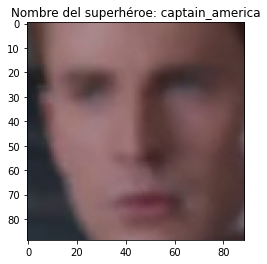

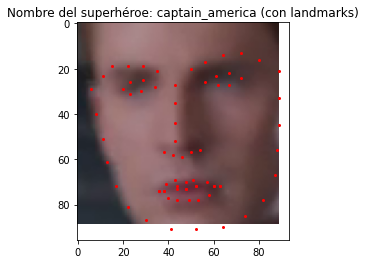

Nombre del superhéroe: captain_america
Landmarks del superhéroe: {'chin': [(6, 29), (8, 40), (11, 51), (13, 61), (17, 72), (22, 81), (30, 87), (41, 91), (52, 91), (64, 90), (74, 85), (82, 78), (87, 67), (88, 56), (89, 45), (89, 33), (89, 21)], 'left_eyebrow': [(11, 23), (15, 19), (22, 19), (29, 19), (35, 21)], 'right_eyebrow': [(50, 20), (56, 17), (64, 14), (72, 13), (80, 16)], 'nose_bridge': [(43, 27), (43, 35), (43, 44), (43, 52)], 'nose_tip': [(38, 57), (42, 58), (46, 59), (50, 57), (54, 56)], 'left_eye': [(20, 29), (23, 26), (29, 25), (34, 28), (28, 30), (23, 31)], 'right_eye': [(56, 26), (61, 23), (67, 22), (72, 24), (67, 27), (62, 27)], 'top_lip': [(36, 74), (39, 71), (43, 69), (48, 70), (51, 69), (57, 70), (63, 72), (60, 72), (52, 72), (48, 73), (44, 73), (38, 74)], 'bottom_lip': [(63, 72), (58, 76), (53, 78), (49, 78), (44, 78), (40, 77), (36, 74), (38, 74), (44, 72), (48, 73), (52, 72), (60, 72)]}
--------------------------------------------------


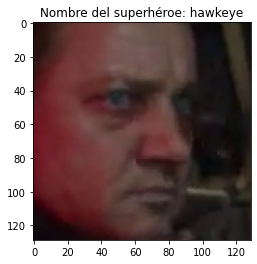

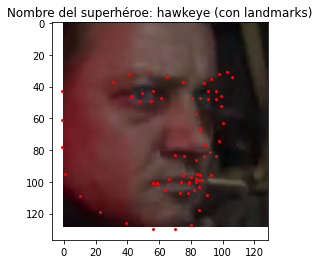

Nombre del superhéroe: hawkeye
Landmarks del superhéroe: {'chin': [(-1, 43), (-1, 61), (-1, 78), (1, 95), (10, 109), (23, 119), (39, 126), (56, 130), (70, 130), (80, 127), (85, 118), (90, 108), (93, 96), (96, 84), (98, 74), (100, 63), (99, 52)], 'left_eyebrow': [(31, 37), (41, 32), (53, 31), (65, 34), (75, 37)], 'right_eyebrow': [(88, 38), (93, 35), (98, 32), (103, 31), (106, 34)], 'nose_bridge': [(81, 47), (83, 57), (86, 67), (89, 77)], 'nose_tip': [(70, 83), (76, 84), (83, 86), (88, 84), (92, 81)], 'left_eye': [(42, 46), (49, 44), (56, 43), (61, 47), (55, 49), (48, 49)], 'right_eye': [(86, 47), (91, 43), (96, 43), (99, 46), (96, 48), (91, 48)], 'top_lip': [(56, 101), (66, 98), (75, 96), (80, 97), (84, 95), (86, 96), (87, 99), (85, 99), (83, 100), (79, 101), (74, 100), (59, 101)], 'bottom_lip': [(87, 99), (85, 103), (82, 105), (78, 107), (73, 107), (64, 105), (56, 101), (59, 101), (74, 100), (79, 100), (83, 98), (85, 99)]}
--------------------------------------------------


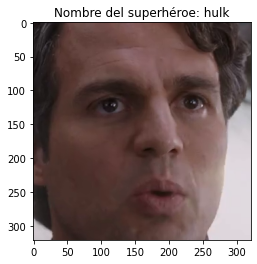

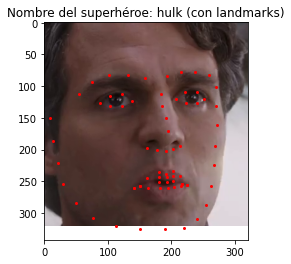

Nombre del superhéroe: hulk
Landmarks del superhéroe: {'chin': [(8, 150), (14, 186), (21, 221), (30, 255), (49, 285), (77, 308), (112, 321), (151, 326), (190, 326), (220, 323), (240, 309), (254, 287), (263, 257), (267, 225), (269, 194), (272, 162), (271, 131)], 'left_eyebrow': [(55, 112), (75, 94), (101, 83), (131, 82), (158, 88)], 'right_eyebrow': [(193, 84), (215, 77), (238, 77), (259, 83), (271, 102)], 'nose_bridge': [(183, 113), (186, 132), (191, 151), (194, 171)], 'nose_tip': [(162, 198), (177, 200), (192, 202), (203, 199), (213, 195)], 'left_eye': [(88, 127), (103, 116), (123, 113), (138, 124), (122, 131), (103, 132)], 'right_eye': [(207, 121), (222, 110), (240, 110), (252, 121), (241, 127), (223, 127)], 'top_lip': [(141, 260), (161, 245), (180, 235), (192, 239), (202, 234), (214, 242), (224, 256), (217, 254), (203, 250), (193, 251), (180, 251), (150, 258)], 'bottom_lip': [(224, 256), (215, 258), (205, 259), (194, 260), (182, 261), (163, 261), (141, 260), (150, 258), (181, 244), 

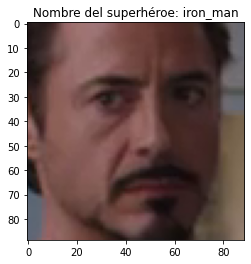

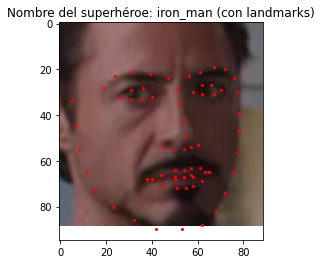

Nombre del superhéroe: iron_man
Landmarks del superhéroe: {'chin': [(5, 34), (7, 45), (8, 55), (11, 65), (15, 73), (23, 80), (32, 86), (42, 90), (53, 90), (62, 88), (68, 82), (72, 74), (76, 65), (77, 56), (78, 47), (78, 39), (77, 30)], 'left_eyebrow': [(19, 28), (24, 23), (31, 21), (39, 22), (47, 24)], 'right_eyebrow': [(56, 23), (61, 21), (67, 19), (72, 20), (76, 24)], 'nose_bridge': [(51, 29), (52, 35), (53, 42), (55, 49)], 'nose_tip': [(45, 54), (49, 55), (54, 55), (57, 54), (60, 53)], 'left_eye': [(27, 32), (31, 29), (36, 28), (40, 32), (36, 33), (31, 33)], 'right_eye': [(58, 30), (62, 27), (66, 27), (70, 29), (67, 31), (62, 31)], 'top_lip': [(38, 68), (44, 66), (50, 64), (54, 64), (57, 63), (61, 63), (65, 65), (63, 65), (57, 66), (54, 67), (50, 67), (40, 68)], 'bottom_lip': [(65, 65), (62, 69), (58, 71), (55, 72), (51, 72), (45, 71), (38, 68), (40, 68), (50, 68), (54, 67), (58, 67), (63, 65)]}
--------------------------------------------------


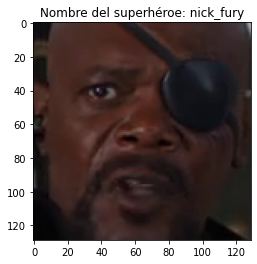

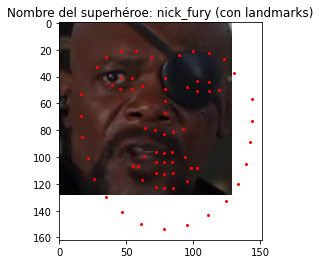

Nombre del superhéroe: nick_fury
Landmarks del superhéroe: {'chin': [(16, 53), (16, 69), (17, 85), (21, 101), (26, 116), (35, 130), (47, 141), (61, 150), (78, 154), (95, 151), (111, 143), (124, 133), (133, 120), (139, 105), (142, 89), (144, 73), (144, 57)], 'left_eyebrow': [(28, 33), (35, 25), (46, 21), (57, 21), (68, 25)], 'right_eyebrow': [(89, 24), (100, 21), (112, 22), (123, 27), (130, 37)], 'nose_bridge': [(79, 41), (79, 49), (79, 58), (79, 67)], 'nose_tip': [(64, 78), (71, 80), (78, 83), (85, 81), (92, 79)], 'left_eye': [(39, 46), (46, 41), (54, 41), (62, 47), (54, 49), (45, 49)], 'right_eye': [(95, 48), (103, 43), (112, 44), (119, 50), (112, 51), (103, 51)], 'top_lip': [(55, 107), (63, 99), (72, 96), (78, 97), (84, 96), (94, 100), (103, 108), (98, 108), (84, 104), (78, 104), (72, 104), (59, 107)], 'bottom_lip': [(103, 108), (95, 118), (85, 123), (78, 123), (72, 122), (62, 117), (55, 107), (59, 107), (72, 112), (78, 113), (85, 112), (98, 108)]}
-----------------------------------

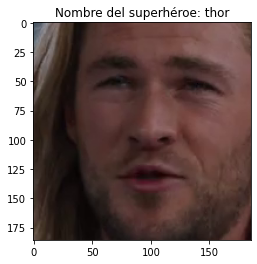

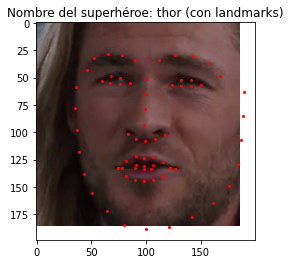

Nombre del superhéroe: thor
Landmarks del superhéroe: {'chin': [(36, 59), (35, 78), (37, 98), (39, 118), (43, 138), (51, 156), (64, 172), (80, 185), (100, 189), (121, 187), (142, 178), (161, 165), (176, 149), (184, 129), (187, 107), (189, 85), (190, 63)], 'left_eyebrow': [(46, 43), (52, 32), (65, 28), (78, 29), (90, 34)], 'right_eyebrow': [(112, 34), (127, 29), (143, 30), (158, 37), (168, 49)], 'nose_bridge': [(101, 51), (100, 65), (99, 79), (98, 93)], 'nose_tip': [(84, 102), (91, 106), (99, 108), (108, 106), (117, 103)], 'left_eye': [(60, 53), (68, 49), (76, 50), (85, 55), (76, 56), (67, 55)], 'right_eye': [(124, 57), (132, 52), (141, 52), (150, 57), (141, 58), (132, 58)], 'top_lip': [(74, 133), (82, 126), (91, 122), (98, 124), (106, 123), (116, 127), (127, 134), (122, 133), (106, 130), (98, 131), (91, 130), (78, 133)], 'bottom_lip': [(127, 134), (116, 140), (106, 144), (98, 145), (90, 144), (82, 140), (74, 133), (78, 133), (90, 133), (98, 134), (105, 134), (122, 133)]}
--------------

In [18]:
avengers_folder = os.path.join("Avengers 1", "Avengers 1")
landmarks_dict = {}
photos_without_landmarks = 0

header = ["nombre_superheroe", "chin", "left_eyebrow", "right_eyebrow", "nose_bridge", "nose_tip", "left_eye", "right_eye", "top_lip", "bottom_lip"]
rows = []

for superhero_folder in os.listdir(avengers_folder):
    superhero_path = os.path.join(avengers_folder, superhero_folder)
    if os.path.isdir(superhero_path):
        for filename in os.listdir(superhero_path):
            image_path = os.path.join(superhero_path, filename)
            if os.path.isfile(image_path):
                try:
                    image = fr.load_image_file(image_path)
                    face_landmarks = fr.face_landmarks(image)

                    if len(face_landmarks) > 0:
                        landmarks = face_landmarks[0]
                        landmarks_dict.setdefault(superhero_folder, []).append(landmarks)
                    else:
                        photos_without_landmarks += 1

                except Exception as e:
                    print(f"Error al procesar la imagen {image_path}: {str(e)}")

# Muestra una imagen sin landmarks y una imagen con landmarks por cada superhéroe
for superhero_folder, landmarks_list in landmarks_dict.items():
    image_path = os.path.join(avengers_folder, superhero_folder, os.listdir(os.path.join(avengers_folder, superhero_folder))[0])
    image = fr.load_image_file(image_path)

    # Muestra la imagen sin landmarks
    plt.imshow(image)
    plt.title(f"Nombre del superhéroe: {superhero_folder}")
    plt.show()

    landmarks = landmarks_list[0]

    # Muestra la imagen con landmarks y dibuja los puntos de referencia
    plt.imshow(image)
    for facial_feature in landmarks.keys():
        for point in landmarks[facial_feature]:
            plt.plot(point[0], point[1], 'ro', markersize=2)
    plt.title(f"Nombre del superhéroe: {superhero_folder} (con landmarks)")
    plt.show()

    # Imprime el nombre del superhéroe y los landmarks
    print("Nombre del superhéroe:", superhero_folder)
    print("Landmarks del superhéroe:", landmarks)
    print("-" * 50)

# Guarda los landmarks en el archivo CSV
csv_file = "landmarks.csv"
with open(csv_file, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(header)
    for superhero_folder, landmarks_list in landmarks_dict.items():
        for landmarks in landmarks_list:
            rows.append([superhero_folder] + [landmarks[feature] for feature in header[1:]])
    writer.writerows(rows)

print(f"Archivo CSV '{csv_file}' generado exitosamente.")
print(f"Número de fotos sin landmarks: {photos_without_landmarks}")

Se decidió no implementar las imágenes que no contenían landmarks por los siguientes motivos:   

- Ayudaría a evitar el desequilibrio en el conjunto de datos, y así podría garantizar que cada clase tenga una representación adecuada posteriomente en cuanto a los modelos.

- Los landmarks es información relevante para el modelo, ya que es la información que se utilizará para entrenar el modelo, por lo que si no lo tiene, no se podría entrenar el modelo de manera correcta y eficiente.

- Mejora la eficiencia computacional en cuando a la carga de datos, ya que no se estarían cargando imágenes que no se utilizarán, y por consiguiente se estaría mejorando la eficacioa en cuanto a la memoria.

In [34]:
df = pd.read_csv("landmarks.csv")

In [35]:
# Ya teniendo el dataframe de los landmarks, es mucho más fácil poder trabajar con las imagenes y sus respectivas landmarks para cada "facción" de la cara.

superheroes = df["nombre_superheroe"].unique()
total_fotos_only_landmarks = 0

# Distribución de clases
class_distribution = {}

for superhero_folder in os.listdir(avengers_folder):
    superhero_path = os.path.join(avengers_folder, superhero_folder)
    if os.path.isdir(superhero_path):
        total_fotos = len(os.listdir(superhero_path))
        class_distribution[superhero_folder] = total_fotos



for superheroe in superheroes:
    total_fotos_only_landmarks_superheroe = df[df["nombre_superheroe"] == superheroe].count()[0]
    total_fotos_superheroe = class_distribution[superheroe]
    print(f"Superhéroe: {superheroe}\n Número de fotos: {total_fotos_superheroe} \n Número de fotos con landmarks: {total_fotos_only_landmarks_superheroe} \n Cantidad de fotos sin landmarks: {total_fotos_superheroe - total_fotos_only_landmarks_superheroe}")
    print("-" * 50)
    total_fotos_only_landmarks += total_fotos_only_landmarks_superheroe

print(f"Total de fotos: {total_fotos_only_landmarks}")


Superhéroe: black_widow
 Número de fotos: 1138 
 Número de fotos con landmarks: 740 
 Cantidad de fotos sin landmarks: 398
--------------------------------------------------
Superhéroe: captain_america
 Número de fotos: 1194 
 Número de fotos con landmarks: 767 
 Cantidad de fotos sin landmarks: 427
--------------------------------------------------
Superhéroe: hawkeye
 Número de fotos: 378 
 Número de fotos con landmarks: 229 
 Cantidad de fotos sin landmarks: 149
--------------------------------------------------
Superhéroe: hulk
 Número de fotos: 976 
 Número de fotos con landmarks: 689 
 Cantidad de fotos sin landmarks: 287
--------------------------------------------------
Superhéroe: iron_man
 Número de fotos: 1854 
 Número de fotos con landmarks: 1452 
 Cantidad de fotos sin landmarks: 402
--------------------------------------------------
Superhéroe: nick_fury
 Número de fotos: 231 
 Número de fotos con landmarks: 62 
 Cantidad de fotos sin landmarks: 169
----------------------

#Actividad 3

In [37]:
df.head()

,nombre_superheroe,chin,left_eyebrow,right_eyebrow,nose_bridge,nose_tip,left_eye,right_eye,top_lip,bottom_lip
0,black_widow,"[(-8, 43), (-6, 67), (-3, 92), (2, 116), (11, ...","[(8, 34), (23, 29), (40, 29), (57, 33), (73, 38)]","[(101, 36), (115, 30), (130, 25), (145, 22), (...","[(88, 50), (89, 66), (90, 83), (91, 99)]","[(72, 109), (81, 111), (89, 113), (97, 111), (...","[(26, 49), (38, 43), (51, 43), (61, 53), (49, ...","[(109, 51), (119, 40), (132, 39), (141, 45), (...","[(56, 139), (69, 133), (82, 129), (90, 131), (...","[(116, 137), (107, 148), (97, 153), (90, 154),..."
1,black_widow,"[(-7, 47), (-5, 71), (-2, 96), (3, 119), (13, ...","[(9, 38), (24, 32), (41, 32), (57, 36), (73, 41)]","[(101, 39), (115, 33), (129, 28), (144, 26), (...","[(88, 53), (89, 69), (90, 85), (91, 102)]","[(72, 112), (81, 114), (90, 116), (98, 114), (...","[(27, 52), (38, 46), (51, 46), (61, 56), (50, ...","[(109, 54), (119, 44), (132, 42), (141, 47), (...","[(58, 142), (70, 136), (82, 131), (89, 134), (...","[(116, 140), (108, 150), (98, 156), (90, 157),..."
2,black_widow,"[(-5, 47), (-4, 71), (0, 95), (5, 118), (15, 1...","[(11, 38), (26, 33), (43, 33), (59, 36), (75, ...","[(103, 39), (118, 33), (132, 28), (147, 26), (...","[(90, 54), (91, 70), (92, 86), (93, 102)]","[(74, 113), (83, 115), (92, 117), (99, 114), (...","[(29, 52), (40, 46), (54, 46), (64, 56), (52, ...","[(111, 54), (122, 44), (134, 42), (144, 48), (...","[(60, 141), (72, 136), (84, 132), (91, 134), (...","[(119, 140), (109, 151), (99, 156), (92, 157),..."
3,black_widow,"[(-5, 46), (-4, 70), (-1, 93), (4, 117), (14, ...","[(10, 38), (24, 32), (41, 32), (57, 36), (73, ...","[(101, 38), (116, 33), (130, 28), (145, 26), (...","[(88, 54), (89, 70), (90, 86), (90, 102)]","[(72, 112), (81, 114), (90, 116), (98, 114), (...","[(28, 52), (38, 46), (52, 46), (62, 56), (50, ...","[(110, 54), (120, 43), (133, 42), (142, 47), (...","[(58, 141), (70, 136), (82, 131), (90, 134), (...","[(116, 140), (107, 150), (98, 156), (90, 157),..."
4,black_widow,"[(-8, 43), (-7, 68), (-3, 92), (1, 116), (11, ...","[(8, 35), (23, 30), (40, 30), (56, 33), (73, 38)]","[(101, 36), (115, 30), (130, 25), (146, 23), (...","[(87, 51), (88, 67), (89, 83), (90, 100)]","[(72, 110), (80, 112), (89, 114), (97, 112), (...","[(26, 49), (37, 43), (51, 43), (62, 53), (49, ...","[(109, 51), (120, 41), (132, 40), (142, 45), (...","[(56, 140), (69, 134), (81, 130), (89, 132), (...","[(116, 138), (107, 149), (97, 154), (89, 156),..."


In [38]:
# Función para extraer las coordenadas de una cadena en formato de tuplas
def extract_coordinates(string):
    pattern = r"\((-?\d+), (-?\d+)\)"
    matches = re.findall(pattern, string)
    coordinates = [(int(x), int(y)) for x, y in matches]
    return coordinates


* Feature #1: Distancia entre cejas para cada superheroe. Lo que se va a calcular es la distancia que se tiene entre las cejas, y luego guardar esta como 'eyebrow_distance' en el dataframe feat_df. La información que se va a codificar es la de 'left_eyebrow' y 'right_eyebrow' de cada superheroe.

In [39]:
# Calcular la distancia entre las cejas para cada fila del DataFrame
eyebrow_distances = []
for left_eyebrow, right_eyebrow in zip(df['left_eyebrow'], df['right_eyebrow']):
    left_coordinates = extract_coordinates(left_eyebrow)
    right_coordinates = extract_coordinates(right_eyebrow)

    if len(left_coordinates) > 0 and len(right_coordinates) > 0:
        left_x, left_y = left_coordinates[0]
        right_x, right_y = right_coordinates[0]
        distance = np.sqrt((right_x - left_x)**2 + (right_y - left_y)**2)
        eyebrow_distances.append(distance)
    else:
        eyebrow_distances.append(np.nan)

# Crear el nuevo DataFrame con las columnas 'nombre_superheroe' y 'eyebrow_distance'
feat_df = pd.DataFrame({
    'nombre_superheroe': df['nombre_superheroe'],
    'eyebrow_distance': eyebrow_distances
})




* Feature #2: Longitud del contorno del mentón. Lo que se va a calcular es la suma de las distancias entre los puntos del contorno del mentón, y luego guardar esta como 'chin_length' en el dataframe feat_df. La información que se va a codificar es la de 'chin' de cada superheroe.

In [40]:
# Calcular la longitud del contorno del mentón para cada fila del DataFrame
chin_lengths = []
for chin in df['chin']:
    coordinates = extract_coordinates(chin)
    if len(coordinates) > 1:
        length = np.sqrt(sum((x2 - x1) ** 2 + (y2 - y1) ** 2 for (x1, y1), (x2, y2) in zip(coordinates[:-1], coordinates[1:])))
        chin_lengths.append(length)
    else:
        chin_lengths.append(np.nan)

# Agregar la columna 'chin_lenght' al DataFrame existente 'feat_df'
feat_df['chin_length'] = chin_lengths



* Feature #3: Relación entre la longitud del contorno del puente de la nariz y de la longitud del contorno del mentón. Lo que se va a calcular es la relación entre la longitud del contorno del puente de la nariz y de la longitud del contorno del mentón, y luego guardar esta como 'nose_chin_ratio' en el dataframe feat_df. La información que se va a codificar es la de 'nose_bridge' y 'chin' de cada superheroe.

In [41]:
nose_chin_ratios = []

for chin, nose_bridge in zip(df['chin'], df['nose_bridge']):
    chin_coordinates = extract_coordinates(chin)
    nose_bridge_coordinates = extract_coordinates(nose_bridge)

    if len(chin_coordinates) > 0 and len(nose_bridge_coordinates) > 0:
        chin_x = [x for x, _ in chin_coordinates]
        chin_y = [y for _, y in chin_coordinates]
        nose_bridge_x = [x for x, _ in nose_bridge_coordinates]
        nose_bridge_y = [y for _, y in nose_bridge_coordinates]

        face_width = max(chin_x) - min(chin_x)
        face_height = max(nose_bridge_y) - min(chin_y)

        if face_width != 0:
            nose_chin_ratio = face_height / face_width
            nose_chin_ratios.append(nose_chin_ratio)
        else:
            nose_chin_ratios.append(np.nan)
    else:
        nose_chin_ratios.append(np.nan)

feat_df['nose_chin_ratio'] = nose_chin_ratios




* Feature #4: Ángulo de inclinación. Lo que se va a calcular es el ángulo de inclinación de la nariz, y luego guardar esta como 'nose_inclination' en el dataframe feat_df. La información que se va a codificar es la de 'nose_bridge', y 'nose_tip' de cada superheroe.

In [42]:
import numpy as np

nose_inclinations = []

for nose_bridge, nose_tip in zip(df['nose_bridge'], df['nose_tip']):
    nose_bridge_coordinates = extract_coordinates(nose_bridge)
    nose_tip_coordinates = extract_coordinates(nose_tip)

    if len(nose_bridge_coordinates) > 0 and len(nose_tip_coordinates) > 0:
        nose_bridge_x = [x for x, _ in nose_bridge_coordinates]
        nose_bridge_y = [y for _, y in nose_bridge_coordinates]
        nose_tip_x = [x for x, _ in nose_tip_coordinates]
        nose_tip_y = [y for _, y in nose_tip_coordinates]

        # Calcular el ángulo de inclinación de la nariz en radianes
        nose_inclination_rad = np.arctan2(nose_tip_y[0] - nose_bridge_y[0], nose_tip_x[0] - nose_bridge_x[0])

        # Convertir el ángulo a grados
        nose_inclination_deg = np.degrees(nose_inclination_rad)

        nose_inclinations.append(nose_inclination_deg)
    else:
        nose_inclinations.append(np.nan)

feat_df['nose_inclination'] = nose_inclinations



* Feature #5: Distancia entre los ojos. Lo que se va a calcular es la distancia entre los ojos, y luego guardar esta como 'eye_distance' en el dataframe feat_df. La información que se va a codificar es la de 'left_eye' y 'right_eye' de cada superheroe.

In [43]:
eye_distances = []

for left_eye, right_eye in zip(df['left_eye'], df['right_eye']):
    left_eye_coordinates = extract_coordinates(left_eye)
    right_eye_coordinates = extract_coordinates(right_eye)

    if len(left_eye_coordinates) > 0 and len(right_eye_coordinates) > 0:
        left_eye_x = [x for x, _ in left_eye_coordinates]
        left_eye_y = [y for _, y in left_eye_coordinates]
        right_eye_x = [x for x, _ in right_eye_coordinates]
        right_eye_y = [y for _, y in right_eye_coordinates]

        # Calcular la distancia entre los ojos
        eye_distance = np.sqrt((right_eye_x[0] - left_eye_x[0])**2 + (right_eye_y[0] - left_eye_y[0])**2)

        eye_distances.append(eye_distance)
    else:
        eye_distances.append(np.nan)

feat_df['eye_distance'] = eye_distances

* Feature #6: Relación ancho y alto de los labios. Lo que se va a calcular es la relación entre el ancho y el alto de los labios, y luego guardar esta como 'lip_ratio' en el dataframe feat_df. La información que se va a codificar es la de 'top_lip' y 'bottom_lip' de cada superheroe.

In [44]:
lip_ratios = []

for top_lip, bottom_lip in zip(df['top_lip'], df['bottom_lip']):
    top_lip_coordinates = extract_coordinates(top_lip)
    bottom_lip_coordinates = extract_coordinates(bottom_lip)

    if len(top_lip_coordinates) > 0 and len(bottom_lip_coordinates) > 0:
        top_lip_x = [x for x, _ in top_lip_coordinates]
        top_lip_y = [y for _, y in top_lip_coordinates]
        bottom_lip_x = [x for x, _ in bottom_lip_coordinates]
        bottom_lip_y = [y for _, y in bottom_lip_coordinates]

        # Calcular el ancho y el alto de los labios
        lip_width = max(bottom_lip_x) - min(top_lip_x)
        lip_height = max(bottom_lip_y) - min(top_lip_y)

        if lip_height != 0:
            lip_ratio = lip_height / lip_width
            lip_ratios.append(lip_ratio)
        else:
            lip_ratios.append(np.nan)
    else:
        lip_ratios.append(np.nan)

feat_df['lip_ratio'] = lip_ratios



* Feature #7: Área del triángulo formado por los ojos y la nariz. Lo que se va a calcular es el área del triángulo formado por los ojos y la nariz, y luego guardar esta como 'eye_nose_area' en el dataframe feat_df. La información que se va a codificar es la de 'left_eye', 'right_eye' y 'nose_tip' de cada superheroe.

In [45]:
eye_nose_areas = []

for left_eye, right_eye, nose_tip in zip(df['left_eye'], df['right_eye'], df['nose_tip']):
    left_eye_coords = extract_coordinates(left_eye)
    right_eye_coords = extract_coordinates(right_eye)
    nose_tip_coords = extract_coordinates(nose_tip)

    if len(left_eye_coords) > 0 and len(right_eye_coords) > 0 and len(nose_tip_coords) > 0:
        # Obtener las coordenadas de los ojos y la nariz
        eye_x = [x for x, _ in left_eye_coords + right_eye_coords]
        eye_y = [y for _, y in left_eye_coords + right_eye_coords]
        nose_x, nose_y = zip(*nose_tip_coords)

        # Calcular el área del triángulo utilizando la fórmula de la mitad del producto cruzado
        area = 0.5 * abs((eye_x[0] - eye_x[1]) * (nose_y[1] - eye_y[0]) - (nose_x[1] - eye_x[0]) * (eye_y[1] - eye_y[0]))
        eye_nose_areas.append(area)
    else:
        eye_nose_areas.append(np.nan)

# Agregar la columna 'eye_nose_area' al dataframe feat_df
feat_df['eye_nose_area'] = eye_nose_areas


* Feature #8: Distancia entre la nariz y la boca. Lo que se va a calcular es la distancia entre la nariz y la boca, y luego guardar esta como 'nose_mouth_distance' en el dataframe feat_df. La información que se va a codificar es la de 'nose_tip' y 'bottom_lip' de cada superheroe.

In [46]:
nose_mouth_distances = []

for nose_tip, top_lip in zip(df['nose_tip'], df['top_lip']):
    nose_tip_coords = extract_coordinates(nose_tip)
    top_lip_coords = extract_coordinates(top_lip)

    if len(nose_tip_coords) > 0 and len(top_lip_coords) > 0:
        nose_x, nose_y = nose_tip_coords[0]
        top_lip_x, top_lip_y = top_lip_coords[0]

        # Calcular la distancia entre la nariz y la boca utilizando la distancia euclidiana
        distance = np.sqrt((top_lip_x - nose_x)**2 + (top_lip_y - nose_y)**2)
        nose_mouth_distances.append(distance)
    else:
        nose_mouth_distances.append(np.nan)

# Agregar la columna 'nose_mouth_distance' al dataframe feat_df
feat_df['nose_mouth_distance'] = nose_mouth_distances


* Feature #9: Relación entre el ancho del puente de la nariz y el ancho de los ojos. Lo que se va a calcular es la relación entre el ancho del puente de la nariz y el ancho de los ojos, y luego guardar esta como 'nose_eye_ratio' en el dataframe feat_df. La información que se va a codificar es la de 'nose_bridge' y 'left_eye', 'right_eye' de cada superheroe.

In [47]:
nose_eye_ratios = []

for nose_bridge, left_eye, right_eye in zip(df['nose_bridge'], df['left_eye'], df['right_eye']):
    nose_bridge_coords = extract_coordinates(nose_bridge)
    left_eye_coords = extract_coordinates(left_eye)
    right_eye_coords = extract_coordinates(right_eye)

    if len(nose_bridge_coords) > 0 and len(left_eye_coords) > 0 and len(right_eye_coords) > 0:
        nose_bridge_width = max(nose_bridge_coords, key=lambda x: x[0])[0] - min(nose_bridge_coords, key=lambda x: x[0])[0]
        left_eye_width = max(left_eye_coords, key=lambda x: x[0])[0] - min(left_eye_coords, key=lambda x: x[0])[0]
        right_eye_width = max(right_eye_coords, key=lambda x: x[0])[0] - min(right_eye_coords, key=lambda x: x[0])[0]

        eye_width = (left_eye_width + right_eye_width) / 2

        if eye_width != 0:
            nose_eye_ratio = nose_bridge_width / eye_width
            nose_eye_ratios.append(nose_eye_ratio)
        else:
            nose_eye_ratios.append(np.nan)
    else:
        nose_eye_ratios.append(np.nan)

# Agregar la columna 'nose_eye_ratio' al dataframe feat_df
feat_df['nose_eye_ratio'] = nose_eye_ratios

* Feature #10: Simetría de la cara. Lo que se va a calcular es la simetría de la cara, y luego guardar esta como 'symmetry_score' en el dataframe feat_df. La información que se va a codificar es la de 'left_eyebrow', 'right_eyebrow', 'left_eye', 'right_eye', 'top_lip', 'bottom_lip', 'nose_tip', 'chin' de cada superheroe.

In [48]:
symmetry_scores = []

for left_eye, right_eye, left_eyebrow, right_eyebrow, nose_bridge, nose_tip, top_lip, bottom_lip in zip(df['left_eye'], df['right_eye'], df['left_eyebrow'], df['right_eyebrow'], df['nose_bridge'], df['nose_tip'], df['top_lip'], df['bottom_lip']):
    # Extraer las coordenadas de los puntos clave en el lado izquierdo
    left_eye_coords = extract_coordinates(left_eye)
    left_eyebrow_coords = extract_coordinates(left_eyebrow)

    # Extraer las coordenadas de los puntos clave en el lado derecho
    right_eye_coords = extract_coordinates(right_eye)
    right_eyebrow_coords = extract_coordinates(right_eyebrow)

    # Calcular la simetría facial comparando las coordenadas de los puntos clave
    symmetry_score = 0

    if len(left_eye_coords) > 0 and len(right_eye_coords) > 0:
        for left_coord, right_coord in zip(left_eye_coords, right_eye_coords):
            symmetry_score += abs(left_coord[0] - right_coord[0])
            symmetry_score += abs(left_coord[1] - right_coord[1])

    if len(left_eyebrow_coords) > 0 and len(right_eyebrow_coords) > 0:
        for left_coord, right_coord in zip(left_eyebrow_coords, right_eyebrow_coords):
            symmetry_score += abs(left_coord[0] - right_coord[0])
            symmetry_score += abs(left_coord[1] - right_coord[1])

    # Añadir el puntaje de simetría al resultado
    symmetry_scores.append(symmetry_score)

feat_df['symmetry_score'] = symmetry_scores


In [49]:
feat_df.head()

,nombre_superheroe,eyebrow_distance,chin_length,nose_chin_ratio,nose_inclination,eye_distance,lip_ratio,eye_nose_area,nose_mouth_distance,nose_eye_ratio,symmetry_score
0,black_widow,93.021503,91.536878,0.335329,105.172915,83.024093,0.433333,207.0,34.000000,0.089552,993
1,black_widow,92.005435,90.371456,0.337349,105.172915,82.024387,0.448276,179.0,33.105891,0.090909,984
2,black_widow,92.005435,90.410176,0.335329,105.172915,82.024387,0.440678,184.5,31.304952,0.088235,986
3,black_widow,91.000000,90.537285,0.343373,105.422161,82.024387,0.448276,151.0,32.202484,0.060606,988
4,black_widow,93.005376,91.983694,0.337278,104.264512,83.024093,0.450000,184.5,34.000000,0.086957,994


#Actividad 4

* Acá se decidió escoger un test_size de 0.2 (es decir, 20% de los datos se reservan para el conjunto de prueba, y el 80% se utiliza para el entrenamiento del modelo) para asi poder encontrar un equilibrio entre tener suficientes datos para entrenar el modelo de manera efectiva y tener suficientes datos de prueba para evaluar su rendimiento de manera confiable. Al asignar una proporción adecuada de datos al conjunto de prueba, se busca evitar el sobreajuste (overfitting) y obtener una estimación realista del rendimiento del modelo en datos no vistos previamente.

In [61]:
# Dividir el conjunto de datos en entrenamiento y prueba
X = feat_df.drop('nombre_superheroe', axis=1)
y = feat_df['nombre_superheroe']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Decision Tree

In [30]:
# Definir los hiperparámetros a explorar en GridSearchCV
param_grid = {'max_depth': [3, 5, 7, None],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4]}

# Crear el modelo de Decision Tree
dt_model = DecisionTreeClassifier()

# Realizar la búsqueda de hiperparámetros con validación cruzada utilizando GridSearchCV
grid_search = GridSearchCV(dt_model, param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)

# Obtener el mejor modelo y sus hiperparámetros
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Evaluar el mejor modelo en el conjunto de prueba
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

# Imprimir los resultados
print("Mejor modelo de Decision Tree:")
print(f"Mejores parámetros: {best_params}")
print(f"Puntaje en validación cruzada: {best_score}")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Accuracy: {accuracy}")


Mejor modelo de Decision Tree:
Mejores parámetros: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Puntaje en validación cruzada: 0.537241010512111
Precisión: 0.5193338602213242
Recall: 0.5328716499270453
F1-Score: 0.5231055996897279
Accuracy: 0.5905680600214362


* Mejor métrica: Recall (0.5328716499270453)
* Peor métrica: Precision (0.5193338602213242)
- El recall es la proporción de positivos reales que se identificaron correctamente. En este caso, el modelo de árbol de decisión tuvo un rendimiento relativamente mejor al identificar los casos positivos en comparación con la precision, que es la proporción de casos identificados como positivos que son realmente positivos. Esto puede indicar que el modelo tiene una tendencia a identificar más casos positivos, aunque con ciertos falsos positivos.

# Random Forest

In [33]:
# Crear el modelo de Random Forest
rf_model = RandomForestClassifier()

# Definir los hiperparámetros a explorar en GridSearchCV
param_grid = {'n_estimators': [100, 200, 300],
              'max_depth': [None, 5, 10],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4]}

# Realizar la búsqueda de hiperparámetros con validación cruzada utilizando GridSearchCV
grid_search = GridSearchCV(rf_model, param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)

# Obtener el mejor modelo y sus hiperparámetros
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Evaluar el mejor modelo en el conjunto de prueba
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

# Imprimir los resultados
print("Mejor modelo de Random Forest:")
print(f"Mejores parámetros: {best_params}")
print(f"Puntaje en validación cruzada: {best_score}")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Accuracy: {accuracy}")


Mejor modelo de Random Forest:
Mejores parámetros: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Puntaje en validación cruzada: 0.6945347071933848
Precisión: 0.7537419225247994
Recall: 0.6633837496767894
F1-Score: 0.6940676392791458
Accuracy: 0.7481243301178992


* Mejor métrica: Precision (0.7537419225247994)
* Peor métrica: Recall (0.6633837496767894)
- La precisión es alta en este modelo, lo que indica que la mayoría de los casos identificados como positivos son realmente positivos. Sin embargo, el recall es ligeramente inferior, lo que implica que el modelo no identifica todos los casos positivos reales. En otras palabras, el modelo es más conservador al identificar casos positivos, pero tiende a ser preciso cuando lo hace.

# Gradient Boosting

In [35]:
# Definir los hiperparámetros a explorar en GridSearchCV
param_grid = {'n_estimators': [50, 100, 150],
              'learning_rate': [0.1, 0.05, 0.01],
              'max_depth': [3, 5, 7]}

# Crear el modelo de Gradient Boosting
gb_model = GradientBoostingClassifier()

# Realizar la búsqueda de hiperparámetros con validación cruzada utilizando GridSearchCV
grid_search = GridSearchCV(gb_model, param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)

# Obtener el mejor modelo y sus hiperparámetros
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Evaluar el mejor modelo en el conjunto de prueba
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

# Imprimir los resultados
print("Mejor modelo de Gradient Boosting:")
print(f"Mejores parámetros: {best_params}")
print(f"Puntaje en validación cruzada: {best_score}")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Accuracy: {accuracy}")

Mejor modelo de Gradient Boosting:
Mejores parámetros: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 150}
Puntaje en validación cruzada: 0.6733640549687581
Precisión: 0.7517478042854684
Recall: 0.5853461827273735
F1-Score: 0.624116784846486
Accuracy: 0.7052518756698821


* Mejor métrica: Precision (0.7517478042854684)
* Peor métrica: Recall (0.5853461827273735)
- Al igual que en el modelo de Random Forest, la precisión es alta en Gradient Boosting, lo que indica una baja proporción de falsos positivos. Sin embargo, el recall es más bajo, lo que sugiere que el modelo no logra identificar todos los casos positivos reales. Esto puede ser el resultado de un sesgo hacia la precisión en lugar de maximizar la exhaustividad.

# KNN

In [37]:
# Definir los hiperparámetros a explorar en GridSearchCV
param_grid = {'n_neighbors': [3, 5, 7],
              'weights': ['uniform', 'distance']}

# Crear el modelo de KNN
knn_model = KNeighborsClassifier()

# Realizar la búsqueda de hiperparámetros con validación cruzada utilizando GridSearchCV
grid_search = GridSearchCV(knn_model, param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)

# Obtener el mejor modelo y sus hiperparámetros
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Evaluar el mejor modelo en el conjunto de prueba
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

# Imprimir los resultados
print("Mejor modelo de KNN:")
print(f"Mejores parámetros: {best_params}")
print(f"Puntaje en validación cruzada: {best_score}")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Accuracy: {accuracy}")

Mejor modelo de KNN:
Mejores parámetros: {'n_neighbors': 7, 'weights': 'distance'}
Puntaje en validación cruzada: 0.48338483514038283
Precisión: 0.5859188771907389
Recall: 0.4574122207371816
F1-Score: 0.4836219426375759
Accuracy: 0.5476956055734191


* Mejor métrica: Precision (0.5859188771907389)
* Peor métrica: Recall (0.4574122207371816)
- El modelo KNN obtiene una mejor precisión en comparación con el recall. Esto implica que el modelo tiene una tendencia a clasificar correctamente la mayoría de los casos positivos identificados, pero también tiene un número relativamente alto de falsos negativos, lo que resulta en un recall más bajo.

# SVM

In [21]:
# Definir los hiperparámetros a explorar
C_values = [1, 10]
gamma_values = [0.1, 1, 10]

best_score = 0
best_model = None
best_params = {}

# Iterar sobre los hiperparámetros y evaluar el rendimiento del modelo
for C in C_values:
    for gamma in gamma_values:
        # Crear el modelo SVM
        svm_model = SVC(kernel='rbf', C=C, gamma=gamma, random_state=42)

        # Entrenar el modelo
        svm_model.fit(X_train, y_train)

        # Evaluar el modelo en el conjunto de prueba
        y_pred = svm_model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='macro')
        recall = recall_score(y_test, y_pred, average='macro')
        f1 = f1_score(y_test, y_pred, average='macro')

        # Actualizar el mejor modelo y sus hiperparámetros si se obtiene un mejor puntaje
        if accuracy > best_score:
            best_score = accuracy
            best_model = svm_model
            best_params = {'C': C, 'gamma': gamma}

# Imprimir los resultados del mejor modelo
print("Mejor modelo de SVM:")
print(f"Mejores parámetros: {best_params}")
print(f"Puntaje: {best_score}")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")


c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\User

Mejor modelo de SVM:
Mejores parámetros: {'C': 10, 'gamma': 0.1}
Puntaje: 0.35476956055734193
Precisión: 0.1862354383813611
Recall: 0.14375000000000002
F1-Score: 0.06832371166394631


c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Por temas prácticos y tiempo de ejecución de código, se decidió utilizar solo el kernel 'rbf' para el modelo SVM, ya que este otorgaba un tiempo de ejecución menor. Se tuvo un 'trade-off' entre el tiempo de ejecución y el rendimiento del modelo, ya que el kernel 'rbf' no otorgaba el mejor rendimiento, pero si un tiempo de ejecución menor. 

* Mejor métrica: Accuracy (0.35476956055734193)
* Peor métrica: F1-Score (0.06832371166394631)
- En este caso, el modelo SVM obtiene una precisión muy baja en todas las métricas evaluadas. El accuracy, que es la proporción total de predicciones correctas, es el mejor en comparación con las otras métricas, pero sigue siendo bajo. El F1-Score, que es una medida que combina la precisión y el recall, también es muy bajo. Esto sugiere que el modelo SVM no es adecuado para este problema de clasificación y necesita ajustes o considerar el uso de otro algoritmo.

# Elección del mejor modelo de todas las familias

In [22]:
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Métricas para comparar los modelos
metrics = ['accuracy', 'precision', 'recall', 'f1']

# Datos de rendimiento de los modelos
models = {
    'Decision Tree': {
        'parameters': {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2},
        'cross_val_score': 0.537241010512111,
        'precision': 0.5193338602213242,
        'recall': 0.5328716499270453,
        'f1': 0.5231055996897279,
        'accuracy': 0.5905680600214362
    },
    'Random Forest': {
        'parameters': {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300},
        'cross_val_score': 0.6945347071933848,
        'precision': 0.7537419225247994,
        'recall': 0.6633837496767894,
        'f1': 0.6940676392791458,
        'accuracy': 0.7481243301178992
    },
    'Gradient Boosting': {
        'parameters': {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 150},
        'cross_val_score': 0.6733640549687581,
        'precision': 0.7517478042854684,
        'recall': 0.5853461827273735,
        'f1': 0.624116784846486,
        'accuracy': 0.7052518756698821
    },
    'KNN': {
        'parameters': {'n_neighbors': 7, 'weights': 'distance'},
        'cross_val_score': 0.48338483514038283,
        'precision': 0.5859188771907389,
        'recall': 0.4574122207371816,
        'f1': 0.4836219426375759,
        'accuracy': 0.5476956055734191
    },
    'SVM': {
        'parameters': {'C': 10, 'gamma': 0.1},
        'cross_val_score': 0.35476956055734193,
        'precision': 0.1862354383813611,
        'recall': 0.14375000000000002,
        'f1': 0.06832371166394631,
        'accuracy': 0.35476956055734193
    }
}

# Calcular el mejor modelo basado en el puntaje de validación cruzada
best_model = max(models, key=lambda x: models[x]['cross_val_score'])

# Imprimir los resultados del mejor modelo
print("Mejor modelo:")
print("Nombre del modelo:", best_model)
print("Mejores parámetros:", models[best_model]['parameters'])
print("Puntaje en validación cruzada:", models[best_model]['cross_val_score'])
for metric in metrics:
    print(f"{metric.capitalize()}: {models[best_model][metric]}")


Mejor modelo:
Nombre del modelo: Random Forest
Mejores parámetros: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Puntaje en validación cruzada: 0.6945347071933848
Accuracy: 0.7481243301178992
Precision: 0.7537419225247994
Recall: 0.6633837496767894
F1: 0.6940676392791458


## Acá se escogió Random Forest como la mejor familia para poder clasificar los superhéroes, ya que este modelo obtuvo los mejores resultados en las métricas evaluadas. A continuación se dará la justificación de esta elección:

* Precisión: El Random Forest obtiene una alta precisión de 0.7537419225247994, lo que indica que la mayoría de los casos identificados como positivos son realmente positivos. Esto significa que el modelo tiene una capacidad sólida para predecir correctamente los casos positivos, reduciendo así la cantidad de falsos positivos.

* Puntaje en validación cruzada: El puntaje en validación cruzada del Random Forest es de 0.6945347071933848. La validación cruzada es una técnica que se utiliza para evaluar el rendimiento de un modelo en diferentes subconjuntos de datos. Un puntaje alto en validación cruzada indica que el modelo generaliza bien y es menos propenso al sobreajuste.

* Recall aceptable: Aunque el recall del Random Forest (0.6633837496767894) es ligeramente inferior en comparación con otras métricas, sigue siendo relativamente alto. Esto significa que el modelo logra identificar una buena proporción de los casos positivos reales, aunque no todos.

* Puntaje F1-Score equilibrado: El F1-Score del Random Forest es de 0.6940676392791458, que es una medida que combina la precisión y el recall. Un puntaje equilibrado en el F1-Score indica que el modelo logra un buen equilibrio entre la precisión y el recall, lo que es deseable en muchos casos.

* Configuración óptima de hiperparámetros: El Random Forest utiliza los hiperparámetros optimizados {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}, lo que indica que se ha realizado una búsqueda exhaustiva para encontrar los valores óptimos de los hiperparámetros. Esto contribuye a mejorar el rendimiento y la capacidad predictiva del modelo.

#Actividad 5

In [51]:
# Función para mostrar la matriz de confusión como una imagen
def plot_confusion_matrix(cm, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
    plt.xlabel("Classes")
    plt.ylabel("Real Values")
    plt.title("Confusion Matrix")
    plt.show()


[[ 95  15   5  12  24   2   7]
 [ 12  91   6  11  24   2  14]
 [  7   2  15   3  10   1   0]
 [  8  15   5  71  19   2   9]
 [ 24  19   6  23 195   2  14]
 [  3   2   0   1   2   5   0]
 [  7  12   6  12  23   3  87]]


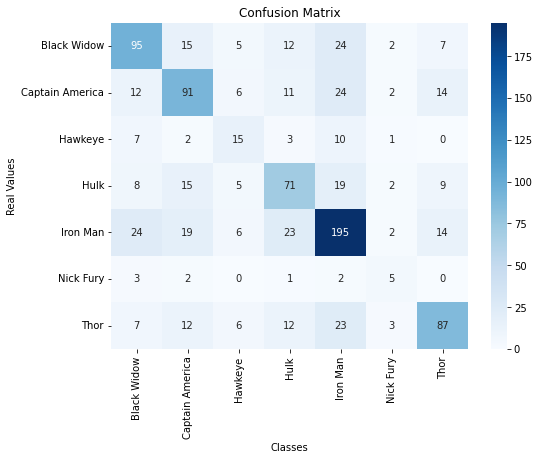

In [52]:
# Crear el modelo de Decision Tree con los mejores hiperparámetros
best_dt_model = DecisionTreeClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2)

# Entrenar el modelo con los datos de entrenamiento
best_dt_model.fit(X_train, y_train)

# Hacer predicciones en los datos de prueba
y_pred_dt = best_dt_model.predict(X_test)

# Generar la matriz de confusión
cm_dt = confusion_matrix(y_test, y_pred_dt)
print(cm_dt)
plot_confusion_matrix(cm_dt, labels=["Black Widow", "Captain America", "Hawkeye", "Hulk","Iron Man", "Nick Fury", "Thor"])



* Error más común: Observando la matriz de confusión, podemos ver que el error más común ocurre en la clasificación de los superhéroes "Iron Man" y "Hulk". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás.

* Superhéroe con el mejor rendimiento: Según la matriz de confusión, el superhéroe con el mejor rendimiento en términos de clasificación correcta es "Iron Man". La mayoría de las predicciones para "Iron Man" están en la diagonal principal de la matriz, lo que indica una alta precisión en su clasificación.

* Superhéroe con el rendimiento más bajo: El superhéroe con el rendimiento más bajo es "Hawkeye". Aunque algunas de las predicciones para "Hawkeye" son correctas, también hay una cantidad considerable de predicciones incorrectas, como se puede observar en las filas correspondientes a "Hawkeye" en la matriz de confusión.

* Vengadores que se confunden más comúnmente: Al analizar las filas de la matriz de confusión, podemos ver que los Vengadores que se confunden más comúnmente son "Hawkeye" y "Captain America". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás, lo que indica una mayor confusión en su clasificación.

* En cuanto a los resultados, las características particulares del modelo de Decision Tree pueden influir en estos resultados. Decision Tree es un modelo basado en reglas de decisión y divisiones recursivas del espacio de características. Dependiendo de la calidad y cantidad de datos de entrenamiento, la profundidad del árbol y otros hiperparámetros, el modelo puede tener diferentes niveles de desempeño. En este caso, es posible que la clasificación de ciertos superhéroes se vea afectada por la cantidad de ejemplos disponibles y la complejidad de sus características distintivas.

[[123   7   3   7  16   0   4]
 [ 10 108   3   7  27   0   5]
 [  2   1  18   6  11   0   0]
 [  6   6   1  88  21   0   7]
 [  7  13   3  14 234   0  12]
 [  1   1   0   3   2   5   1]
 [  2   8   1   7  31   0 101]]


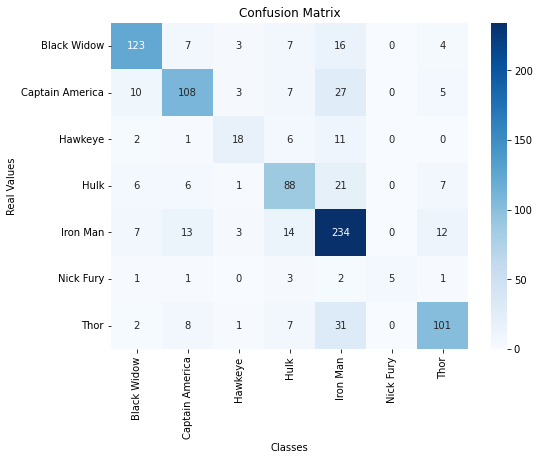

In [53]:
# Random Forest
best_rf_model = RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300)
best_rf_model.fit(X_train, y_train)
y_pred_rf = best_rf_model.predict(X_test)
cm_rf = confusion_matrix(y_test, y_pred_rf)
print(cm_rf)
plot_confusion_matrix(cm_rf, labels=["Black Widow", "Captain America", "Hawkeye", "Hulk", "Iron Man", "Nick Fury", "Thor"])

* Error más común: Observando la matriz de confusión, el error más común se encuentra en la clasificación de los superhéroes "Iron Man" y "Thor". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás.

* Superhéroe con el mejor rendimiento: Según la matriz de confusión, el superhéroe con el mejor rendimiento en términos de clasificación correcta es "Iron Man". La mayoría de las predicciones para "Iron Man" están en la diagonal principal de la matriz, lo que indica una alta precisión en su clasificación.

* Superhéroe con el rendimiento más bajo: El superhéroe con el rendimiento más bajo es "Hawkeye". Aunque algunas de las predicciones para "Hawkeye" son correctas, también hay una cantidad considerable de predicciones incorrectas, como se puede observar en las filas correspondientes a "Hawkeye" en la matriz de confusión.

* Vengadores que se confunden más comúnmente: Al analizar las filas de la matriz de confusión, podemos ver que los Vengadores que se confunden más comúnmente son "Hawkeye" y "Captain America". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás, lo que indica una mayor confusión en su clasificación.

* En cuanto a los resultados, Random Forest es un modelo de conjunto que combina múltiples árboles de decisión. Cada árbol individual en el conjunto es entrenado con una muestra aleatoria de datos y características. Este enfoque de conjunto ayuda a reducir el sobreajuste y mejora la generalización del modelo. En el caso de Random Forest, es posible que el modelo haya logrado capturar mejor las características distintivas de algunos superhéroes, lo que se refleja en una mejor clasificación para "Iron Man". Sin embargo, sigue habiendo cierta confusión en la clasificación de "Hawkeye" y "Captain America", lo que podría deberse a la dificultad de distinguir entre estas clases debido a características similares o falta de ejemplos representativos en los datos de entrenamiento.

[[114  12   2   9  18   0   5]
 [  8 109   1   8  27   0   7]
 [  2   1  15   7  12   0   1]
 [  6   4   3  84  27   0   5]
 [  6   7   1  13 247   1   8]
 [  0   0   0   3   6   3   1]
 [  4   9   0   5  37   0  95]]


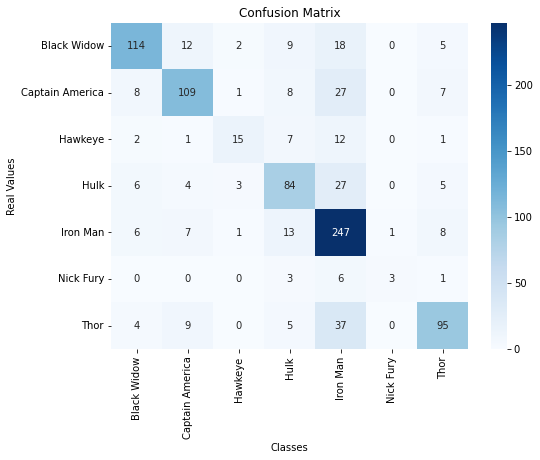

In [54]:
# Gradient Boosting
best_gb_model = GradientBoostingClassifier(learning_rate=0.1, max_depth=7, n_estimators=150)
best_gb_model.fit(X_train, y_train)
y_pred_gb = best_gb_model.predict(X_test)
cm_gb = confusion_matrix(y_test, y_pred_gb)
print(cm_gb)
plot_confusion_matrix(cm_gb, labels=["Black Widow", "Captain America", "Hawkeye", "Hulk", "Iron Man", "Nick Fury", "Thor"])

* Error más común: Observando la matriz de confusión, el error más común se encuentra en la clasificación de los superhéroes "Hulk" y "Thor". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás.

* Superhéroe con el mejor rendimiento: Según la matriz de confusión, el superhéroe con el mejor rendimiento en términos de clasificación correcta es "Iron Man". La mayoría de las predicciones para "Iron Man" están en la diagonal principal de la matriz, indicando una alta precisión en su clasificación.

* Superhéroe con el rendimiento más bajo: El superhéroe con el rendimiento más bajo es "Hawkeye". Aunque algunas de las predicciones para "Hawkeye" son correctas, también hay una cantidad considerable de predicciones incorrectas, como se puede observar en las filas correspondientes a "Hawkeye" en la matriz de confusión.

* Vengadores que se confunden más comúnmente: Al analizar las filas de la matriz de confusión, podemos ver que los Vengadores que se confunden más comúnmente son "Hulk" y "Thor". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás, lo que indica una mayor confusión en su clasificación.

* En cuanto a los resultados, Gradient Boosting es un algoritmo de aprendizaje automático que construye un conjunto de modelos débiles de manera secuencial, donde cada modelo se enfoca en corregir los errores del modelo anterior. Esto permite un mejor ajuste a los datos y una mejora gradual en el rendimiento. En el caso de Gradient Boosting, es posible que el modelo haya logrado capturar las características distintivas de algunos superhéroes, como "Iron Man", lo que se refleja en una mejor clasificación para ese superhéroe. Sin embargo, sigue habiendo cierta confusión en la clasificación de "Hawkeye" y "Thor", lo que podría deberse a características similares o falta de ejemplos representativos en los datos de entrenamiento.

[[ 74  17   5  23  28   0  13]
 [ 13  80   3  13  35   0  16]
 [  5   2  11   8  10   0   2]
 [ 16   8   4  66  29   0   6]
 [  9  26   2  23 204   0  19]
 [  2   2   0   3   2   3   1]
 [  7  14   4   9  43   0  73]]


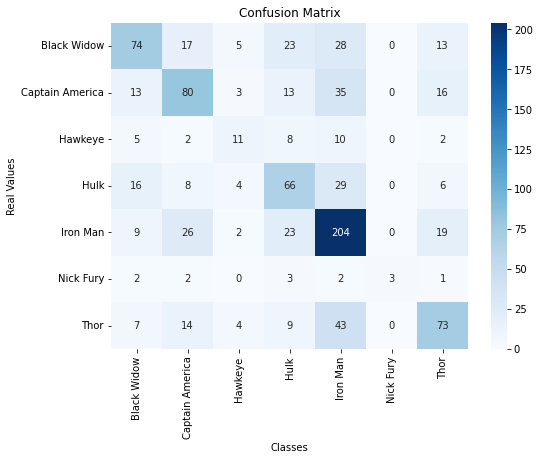

In [55]:
# KNN
best_knn_model = KNeighborsClassifier(n_neighbors=7, weights='distance')
best_knn_model.fit(X_train, y_train)
y_pred_knn = best_knn_model.predict(X_test)
cm_knn = confusion_matrix(y_test, y_pred_knn)
print(cm_knn)
plot_confusion_matrix(cm_knn, labels=["Black Widow", "Captain America", "Hawkeye", "Hulk", "Iron Man", "Nick Fury", "Thor"])

* Error más común: Observando la matriz de confusión, el error más común se encuentra en la clasificación de los superhéroes "Hawkeye" y "Thor". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás.

* Superhéroe con el mejor rendimiento: Según la matriz de confusión, el superhéroe con el mejor rendimiento en términos de clasificación correcta es "Iron Man". La mayoría de las predicciones para "Iron Man" están en la diagonal principal de la matriz, indicando una alta precisión en su clasificación.

* Superhéroe con el rendimiento más bajo: El superhéroe con el rendimiento más bajo es "Hawkeye". Aunque algunas de las predicciones para "Hawkeye" son correctas, también hay una cantidad considerable de predicciones incorrectas, como se puede observar en las filas correspondientes a "Hawkeye" en la matriz de confusión.

* Vengadores que se confunden más comúnmente: Al analizar las filas de la matriz de confusión, podemos ver que los Vengadores que se confunden más comúnmente son "Hawkeye" y "Thor". Estos dos superhéroes tienen una mayor cantidad de predicciones incorrectas en comparación con los demás, lo que indica una mayor confusión en su clasificación.

* En el caso de KNN (K-Nearest Neighbors), este algoritmo se basa en la cercanía de los puntos de datos en un espacio multidimensional. La clasificación de un punto se determina por los votos de los puntos cercanos. En este caso, es posible que KNN tenga dificultades para diferenciar entre los superhéroes "Hawkeye" y "Thor" debido a sus características similares o la falta de ejemplos representativos en los datos de entrenamiento. Además, KNN es sensible a la escala de las características, por lo que un adecuado escalado de los datos puede influir en su rendimiento. Es posible que se requiera un ajuste adicional de los hiperparámetros o la selección de un valor de K óptimo para mejorar la precisión de la clasificación.

[[ 12   0   1   0 147   0   0]
 [  1  12   0   0 147   0   0]
 [  0   0   1   0  37   0   0]
 [  1   1   0   9 118   0   0]
 [  0   0   0   1 281   0   1]
 [  0   0   0   0  13   0   0]
 [  0   1   0   0 133   0  16]]


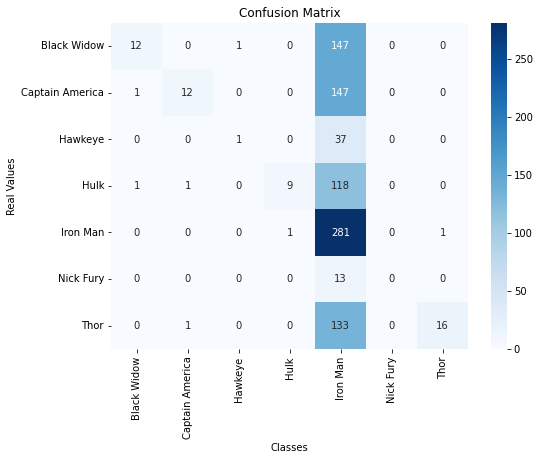

In [56]:
# SVM
best_svm_model = SVC(C=10, gamma=0.1)
best_svm_model.fit(X_train, y_train)
y_pred_svm = best_svm_model.predict(X_test)
cm_svm = confusion_matrix(y_test, y_pred_svm)
print(cm_svm)
plot_confusion_matrix(cm_svm, labels=["Black Widow", "Captain America", "Hawkeye", "Hulk", "Iron Man", "Nick Fury", "Thor"])

* Error más común: Al observar la matriz de confusión, se puede notar que el error más común ocurre al clasificar los superhéroes "Black Widow", "Captain America" y "Iron Man". Estos tres superhéroes tienen un número considerable de predicciones incorrectas en comparación con los demás.

* Superhéroe con el mejor rendimiento: Según la matriz de confusión, el superhéroe con el mejor rendimiento en términos de clasificación correcta es "Iron Man". La mayoría de las predicciones para "Iron Man" están en la diagonal principal de la matriz, indicando una alta precisión en su clasificación.

* Superhéroe con el rendimiento más bajo: Varios superhéroes tienen un rendimiento bajo en términos de clasificación correcta, como "Hawkeye" y "Nick Fury", ya que tienen un número significativo de predicciones incorrectas.

* Vengadores que se confunden más comúnmente: Al analizar las filas de la matriz de confusión, podemos ver que los Vengadores que se confunden más comúnmente son "Black Widow", "Captain America" e "Iron Man". Estos superhéroes tienen un número considerable de predicciones incorrectas, lo que indica una mayor confusión en su clasificación.

En el caso de SVM (Support Vector Machine), este modelo se basa en encontrar un hiperplano óptimo que separe las clases en un espacio multidimensional. Sin embargo, en este caso, el modelo de SVM parece tener dificultades para clasificar correctamente a varios superhéroes, lo que resulta en un rendimiento generalmente bajo. Esto puede deberse a la falta de separabilidad lineal entre las clases, especialmente para los superhéroes "Black Widow", "Captain America" e "Iron Man". Además, es posible que los hiperparámetros seleccionados no sean los óptimos para este conjunto de datos, lo que puede afectar negativamente el rendimiento del modelo SVM. En casos como este, puede ser necesario explorar diferentes configuraciones de hiperparámetros o incluso considerar otros modelos de clasificación más adecuados para el problema en cuestión.

#Actividad 6

# LIME Decision Tree

In [62]:
import lime
from lime import lime_tabular
import numpy as np

# Convertir los conjuntos de entrenamiento y prueba a matrices NumPy
X_train = X_train.values
X_test = X_test.values

# Definir los nombres de las características y las clases
feature_names = ['eyebrow_distance', 'chin_length', 'nose_chin_ratio', 'nose_inclination', 'eye_distance', 'lip_ratio', 'eye_nose_area', 'nose_mouth_distance', 'nose_eye_ratio', 'symmetry_score']
class_names = ['Black Widow', 'Captain America', 'Hawkeye', 'Hulk', 'Iron Man', 'Nick Fury', 'Thor']

# Crear un objeto Explainer de LIME
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, mode='classification')

# Seleccionar una instancia para explicar
instance = X_test[0]

# Definir la función de predicción del modelo de Decision Tree
def predict_fn(X):
    return best_dt_model.predict_proba(X)

# Explicar la predicción del modelo de Decision Tree utilizando LIME
explanation = explainer.explain_instance(instance, predict_fn, num_features=len(feature_names))

# Obtener las características más importantes y sus pesos
top_features = explanation.as_list()

# Imprimir las características más importantes con sus pesos
for feature in top_features:
    print(feature)

# Visualizar la explicación utilizando el gráfico de barras
explanation.show_in_notebook()

('40.66 < eyebrow_distance <= 67.00', -0.04781068850542192)
('nose_mouth_distance <= 18.79', 0.04299790446710727)
('0.20 < nose_chin_ratio <= 0.28', -0.039956538259682976)
('lip_ratio <= 0.36', -0.03961066487085085)
('47.85 < chin_length <= 78.72', 0.027862821341048748)
('27.00 < eye_nose_area <= 84.75', -0.027747981249860793)
('38.47 < eye_distance <= 63.35', 0.015604531120939267)
('488.75 < symmetry_score <= 812.50', 0.01015831471911297)
('107.16 < nose_inclination <= 112.09', -0.009228244385436667)
('0.19 < nose_eye_ratio <= 0.33', 0.00775615438350939)


c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


# LIME Random Forest

In [63]:

# Crear un objeto Explainer de LIME
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, mode='classification')

# Seleccionar una instancia para explicar
instance = X_test[0]

# Definir la función de predicción del modelo de Random Forest
def predict_fn(X):
    return best_rf_model.predict_proba(X)

# Explicar la predicción del modelo de Random Forest utilizando LIME
explanation = explainer.explain_instance(instance, predict_fn, num_features=len(feature_names))

# Obtener las características más importantes y sus pesos
top_features = explanation.as_list()

# Imprimir las características más importantes con sus pesos
for feature in top_features:
    print(feature)

# Visualizar la explicación utilizando el gráfico de barras
explanation.show_in_notebook()


c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


('nose_mouth_distance <= 18.79', -0.04126869922844022)
('lip_ratio <= 0.36', -0.02660032409468073)
('488.75 < symmetry_score <= 812.50', 0.019380294709530153)
('38.47 < eye_distance <= 63.35', 0.01583016945943466)
('47.85 < chin_length <= 78.72', 0.012992122018251437)
('27.00 < eye_nose_area <= 84.75', -0.009444181627522754)
('0.20 < nose_chin_ratio <= 0.28', -0.009313915302167507)
('107.16 < nose_inclination <= 112.09', 0.0019629548464955176)
('0.19 < nose_eye_ratio <= 0.33', 0.001445402520732611)
('40.66 < eyebrow_distance <= 67.00', -0.001184441170211754)


# LIME Gradient Boosting

In [64]:
# Crear un objeto Explainer de LIME
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, mode='classification')

# Seleccionar una instancia para explicar
instance = X_test[0]

# Definir la función de predicción del modelo de Gradient Boosting
def predict_fn(X):
    return best_gb_model.predict_proba(X)

# Explicar la predicción del modelo de Gradient Boosting utilizando LIME
explanation = explainer.explain_instance(instance, predict_fn, num_features=len(feature_names))

# Obtener las características más importantes y sus pesos
top_features = explanation.as_list()

# Imprimir las características más importantes con sus pesos
for feature in top_features:
    print(feature)

# Visualizar la explicación utilizando el gráfico de barras
explanation.show_in_notebook()

c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


('47.85 < chin_length <= 78.72', 0.1361179796041115)
('nose_mouth_distance <= 18.79', -0.09978729322210848)
('27.00 < eye_nose_area <= 84.75', -0.08006021955787111)
('38.47 < eye_distance <= 63.35', -0.05649658526453128)
('488.75 < symmetry_score <= 812.50', 0.03378678163730774)
('0.20 < nose_chin_ratio <= 0.28', -0.019406872756819873)
('0.19 < nose_eye_ratio <= 0.33', 0.014890957599270402)
('40.66 < eyebrow_distance <= 67.00', 0.013926382602587327)
('lip_ratio <= 0.36', 0.009668615342873678)
('107.16 < nose_inclination <= 112.09', -0.004870253282968581)


# LIME KNN

In [65]:
# Crear un objeto Explainer de LIME
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, mode='classification')

# Seleccionar una instancia para explicar
instance = X_test[0]

# Definir la función de predicción del modelo de KNN
def predict_fn(X):
    return best_knn_model.predict_proba(X)

# Explicar la predicción del modelo de KNN utilizando LIME
explanation = explainer.explain_instance(instance, predict_fn, num_features=len(feature_names))

# Obtener las características más importantes y sus pesos
top_features = explanation.as_list()

# Imprimir las características más importantes con sus pesos
for feature in top_features:
    print(feature)

# Visualizar la explicación utilizando el gráfico de barras
explanation.show_in_notebook()

('nose_mouth_distance <= 18.79', -0.032358188494196694)
('47.85 < chin_length <= 78.72', -0.018457687534858727)
('0.19 < nose_eye_ratio <= 0.33', -0.016422280045027538)
('lip_ratio <= 0.36', -0.007185240461777898)
('38.47 < eye_distance <= 63.35', 0.006157132926025207)
('0.20 < nose_chin_ratio <= 0.28', -0.004822307306043905)
('40.66 < eyebrow_distance <= 67.00', -0.004669471876048615)
('27.00 < eye_nose_area <= 84.75', 0.003560909263350051)
('107.16 < nose_inclination <= 112.09', 0.0022103366386977733)
('488.75 < symmetry_score <= 812.50', -0.0010691006587251386)


c:\Users\paulm\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


# LIME SVM

In [69]:
from sklearn.svm import SVC

# Crear una nueva instancia de SVM con probability=True
best_svm_model_proba = SVC(probability=True)
best_svm_model_proba.fit(X_train, y_train)

# Definir la función de predicción del modelo SVM con probabilidad
def predict_fn_proba(X):
    return best_svm_model_proba.predict_proba(X)

# Crear un objeto Explainer de LIME con el nuevo modelo SVM
explainer_proba = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, mode='classification')

# Explicar la predicción del modelo SVM utilizando LIME
explanation_proba = explainer_proba.explain_instance(instance, predict_fn_proba, num_features=len(feature_names))

# Obtener las características más importantes y sus pesos
top_features_proba = explanation_proba.as_list()

# Imprimir las características más importantes con sus pesos
for feature in top_features_proba:
    print(feature)

# Visualizar la explicación utilizando el gráfico de barras
explanation_proba.show_in_notebook()


('488.75 < symmetry_score <= 812.50', 0.020292301562750244)
('27.00 < eye_nose_area <= 84.75', -0.013038102428286924)
('nose_mouth_distance <= 18.79', -0.006254709906984706)
('107.16 < nose_inclination <= 112.09', 0.003939658874386091)
('38.47 < eye_distance <= 63.35', 0.003936358478907627)
('0.20 < nose_chin_ratio <= 0.28', -0.0021408416619569572)
('40.66 < eyebrow_distance <= 67.00', 0.0012143343685716522)
('0.19 < nose_eye_ratio <= 0.33', -0.0006347776813725471)
('47.85 < chin_length <= 78.72', 0.00043520494858493485)
('lip_ratio <= 0.36', -0.00018820929890361697)


#Bonus